Preprocessing → HVG → Clustering → XGBoost → SHAP → Comparison → SHAP-only model


In [ ]:
import pandas as pd
import scanpy as sc
import scipy.sparse as sp
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import numpy as np
import os
from sklearn.preprocessing import LabelEncoder, label_binarize
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

In [ ]:
# Load the filtered 10x HDF5 matrix
adata = sc.read_10x_h5(r"20k_PBMC_3p_HT_nextgem_Chromium_X_filtered_feature_bc_matrix.h5") # your .h5 file path
adata.var_names_make_unique()

# Convert the sparse expression matrix to a dense Pandas DataFrame
df_expr = pd.DataFrame(
    adata.X.toarray(),             # Convert sparse to dense
    index=adata.obs_names,         # Set cell barcodes as row index
    columns=adata.var_names        # Set gene symbols as column names
)

# Confirm the index and shape
print(df_expr.shape)
print(df_expr.index[:5])          # Show cell IDs
df_expr.head()

(23837, 36601)
Index(['AAACCCAAGAGCAGCT-1', 'AAACCCACAATACCTG-1', 'AAACCCACACAACCGC-1',
       'AAACCCACACACAGAG-1', 'AAACCCACACGGCACT-1'],
      dtype='object')


,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.5,AL627309.4,AP006222.2,AL732372.1,...,AC133551.1,AC136612.1,AC136616.1,AC136616.3,AC136616.2,AC141272.1,AC023491.2,AC007325.1,AC007325.4,AC007325.2
AAACCCAAGAGCAGCT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCACAATACCTG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCACACAACCGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCACACACAGAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AAACCCACACGGCACT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
# Preprocessing
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [4]:
#  Feature selection (highly variable genes)
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
adata = adata[:, adata.var.highly_variable]

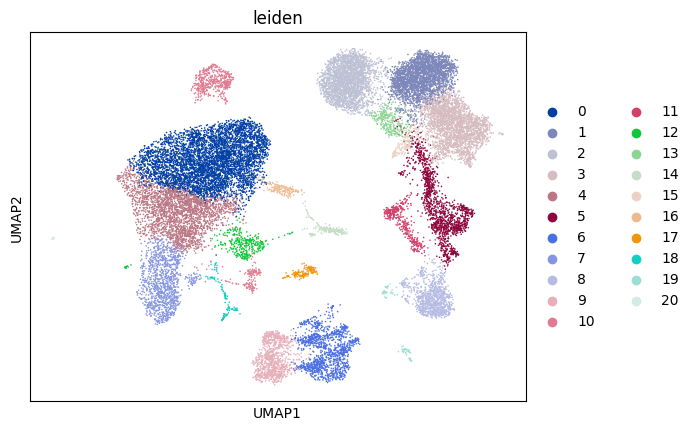

In [5]:
#Dimensionality reduction and neighbors
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.umap(adata)

# Clustering
sc.tl.leiden(adata, resolution=0.5)
sc.pl.umap(adata, color=['leiden'])

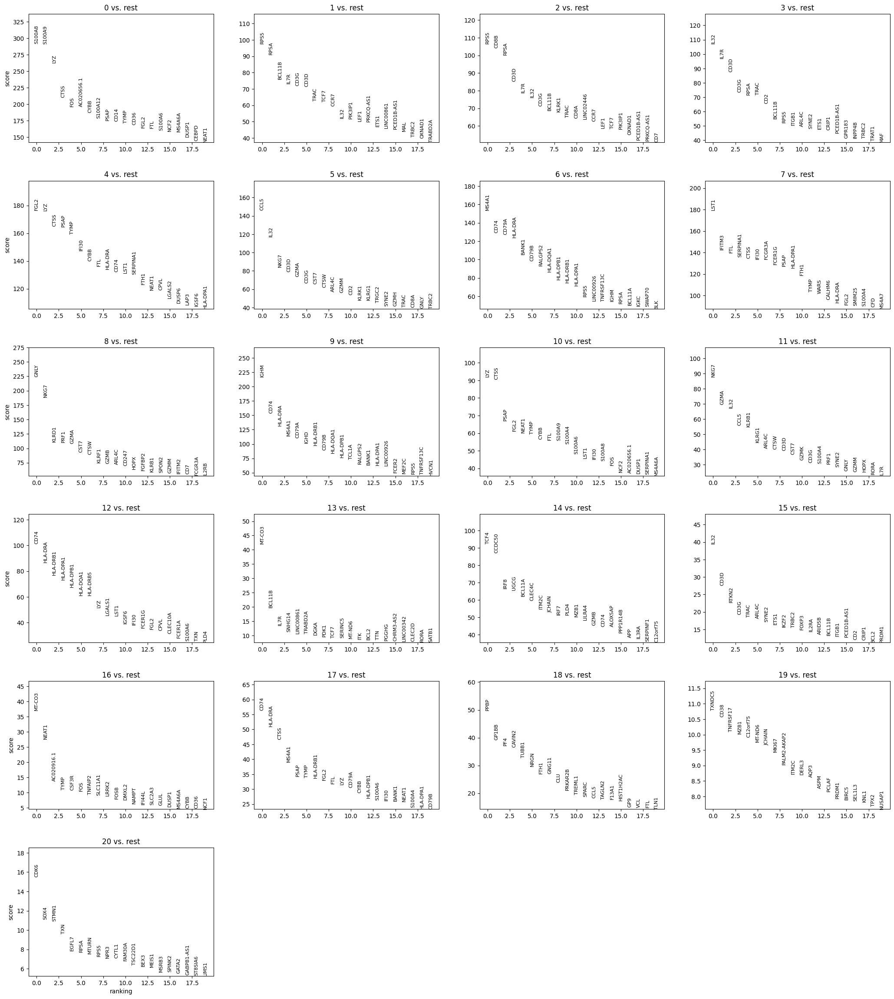

In [6]:
# Marker genes for interpretation
sc.tl.rank_genes_groups(adata, groupby='leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)


In [7]:
# Prepare data for XGBoost
X = adata.X  # shape: [cells x selected genes]
y = adata.obs['leiden'].astype(int) # labels from clustering, unsupervised clusters that model is now learning to predict from gene expression.

In [8]:
print("How many clusters we have:",adata.obs['leiden'].value_counts())

How many clusters we have: leiden
0     4915
1     2730
2     2638
3     2579
4     2538
5     1396
6     1263
7     1174
8      952
9      943
10     667
11     390
12     344
13     306
14     222
15     179
16     166
17     155
18     117
19      73
20      19
Name: count, dtype: int64


#### Scanpy to find the top genes that differentiate each cluster.


In [9]:
top_n = 10
groups = adata.uns['rank_genes_groups']['names'].dtype.names
marker_dict = {}

for group in groups:
    top_genes = adata.uns['rank_genes_groups']['names'][group][:top_n]
    scores = adata.uns['rank_genes_groups']['scores'][group][:top_n]
    marker_dict[group] = list(zip(top_genes, scores))

marker_df = pd.DataFrame(marker_dict)
#marker_df.to_csv("top_marker_genes_per_cluster.csv")

In [10]:
marker_df

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,"(S100A8, 291.8444)","(RPS5, 97.76485)","(RPS5, 106.67444)","(IL32, 107.34862)","(FGL2, 176.56215)","(CCL5, 146.06056)","(MS4A1, 153.62605)","(LST1, 179.37408)","(GNLY, 223.72104)","(IGHM, 216.5615)",...,"(NKG7, 87.65601)","(CD74, 101.26564)","(MT-CO3, 42.110466)","(TCF4, 92.47266)","(IL32, 39.51876)","(MT-CO3, 37.062214)","(CD74, 56.31801)","(PPBP, 49.785618)","(TXNDC5, 10.780551)","(CDK6, 15.470058)"
1,"(S100A9, 290.7925)","(RPSA, 90.96208)","(CD8B, 104.1404)","(IL7R, 97.058655)","(LYZ, 176.35806)","(IL32, 117.08439)","(CD74, 128.91046)","(IFITM3, 142.56725)","(NKG7, 188.54045)","(CD74, 153.19955)",...,"(GZMA, 69.57598)","(HLA-DRA, 86.66221)","(BCL11B, 19.76756)","(CCDC50, 87.11676)","(CD3D, 27.59749)","(NEAT1, 27.615263)","(HLA-DRA, 51.01959)","(GP1BB, 39.20861)","(CD38, 10.574165)","(SOX4, 11.08039)"
2,"(LYZ, 262.886)","(BCL11B, 75.80892)","(RPSA, 100.225174)","(CD3D, 87.616844)","(CTSS, 165.0269)","(NKG7, 84.2431)","(CD79A, 127.29015)","(FTL, 139.92604)","(KLRD1, 111.37092)","(HLA-DRA, 131.75839)",...,"(IL32, 67.252045)","(HLA-DRB1, 76.89325)","(IL7R, 13.479851)","(IRF8, 66.75013)","(RTKN2, 22.717243)","(AC020916.1, 13.785602)","(CTSS, 46.61231)","(PF4, 37.176693)","(TNFRSF17, 10.097907)","(STMN1, 10.937465)"
3,"(CTSS, 210.09256)","(IL7R, 73.35332)","(CD3D, 85.21172)","(CD3G, 73.33664)","(PSAP, 164.56635)","(CD3D, 79.03263)","(HLA-DRA, 123.932945)","(SERPINA1, 135.52808)","(PRF1, 110.56378)","(MS4A1, 114.01676)",...,"(CCL5, 55.655636)","(HLA-DPA1, 73.2109)","(SNHG14, 11.264102)","(UGCG, 65.64987)","(CD3G, 19.201002)","(TYMP, 10.841488)","(MS4A1, 39.071735)","(CAVIN2, 36.596893)","(MZB1, 10.018154)","(TXN, 9.622986)"
4,"(FOS, 196.2048)","(CD3G, 72.02701)","(IL7R, 78.88146)","(RPSA, 71.67743)","(TYMP, 159.34016)","(GZMA, 73.7127)","(BANK1, 105.26935)","(CTSS, 134.4052)","(GZMA, 108.3241)","(CD79A, 110.64194)",...,"(KLRB1, 55.012787)","(HLA-DPB1, 67.34089)","(LINC00861, 10.585537)","(BCL11A, 62.226894)","(TRAC, 18.435627)","(CSF3R, 10.769887)","(PSAP, 34.29091)","(TUBB1, 32.853992)","(C12orf75, 9.912078)","(EGFL7, 7.855592)"
5,"(AC020656.1, 196.14188)","(CD3D, 71.42885)","(IL32, 76.112206)","(TRAC, 71.631805)","(IFI30, 147.40901)","(CD3G, 66.51088)","(CD79B, 98.487305)","(IFI30, 133.86288)","(CST7, 93.38781)","(IGHD, 101.204926)",...,"(KLRG1, 44.55223)","(HLA-DQA1, 61.046455)","(TRABD2A, 10.560115)","(CLEC4C, 59.57291)","(ARL4C, 18.099848)","(FOS, 10.507524)","(TYMP, 33.819878)","(NRGN, 29.604338)","(MT-ND6, 9.7529)","(RPSA, 7.73445)"
6,"(CYBB, 187.16226)","(TRAC, 62.705936)","(CD3G, 71.262276)","(CD2, 65.48673)","(CYBB, 140.12428)","(CST7, 65.79537)","(RALGPS2, 93.22213)","(FCGR3A, 133.5604)","(CTSW, 89.61452)","(HLA-DRB1, 97.36431)",...,"(ARL4C, 40.66073)","(HLA-DRB5, 60.964485)","(DGKA, 10.189751)","(ITM2C, 54.9318)","(SYNE2, 17.128448)","(TNFAIP2, 9.291099)","(HLA-DRB1, 33.634277)","(FTH1, 27.034735)","(JCHAIN, 9.658795)","(MTURN, 7.538123)"
7,"(S100A12, 178.0119)","(TCF7, 62.17149)","(BCL11B, 68.73481)","(BCL11B, 54.860424)","(FTL, 136.22127)","(CTSW, 61.79571)","(HLA-DQA1, 86.51702)","(FCER1G, 128.80714)","(KLRF1, 75.30238)","(CD79B, 89.13855)",...,"(CTSW, 40.09862)","(LYZ, 51.50631)","(PDK1, 9.545883)","(JCHAIN, 53.006382)","(ETS1, 16.329794)","(SLC11A1, 9.065106)","(FGL2, 32.988987)","(GNG11, 26.935415)","(MKI67, 9.440449)","(RPS5, 7.2823944)"
8,"(PSAP, 175.17633)","(CCR7, 59.49396)","(KLRK1, 68.00292)","(RPS5, 52.379097)","(HLA-DRA, 134.15399)","(ARL4C, 56.93367)","(HLA-DPB1, 78.12633)","(PSAP, 127.291084)","(GZMB, 73.13867)","(HLA-DQA1, 84.16569)",...,"(CD3D, 39.293076)","(LGALS1, 45.38315)","(TCF7, 9.1249275)","(IRF7, 51.388577)","(IKZF2, 15.68656)","(LRRK2, 8.819608)","(FTL, 31.80223)","(CLU, 23.859165)","(PALM2-AKAP2, 9.029249)","(NPR3, 7.0960455)"
9,"(CD14, 173.79349)","(IL32, 51.89118)","(TRAC, 64.886375)","(ITGB1, 50.592518)","(CD74, 132.26842)","(GZMM, 56.24619)","(HLA-DRB1, 74.681725)","(HLA-DPA1, 125.51523)","(ARL4C, 71.574066)","(HLA-DPB1, 76.44941)

In [11]:
# Step 6: Annotate clusters using marker genes
pbmc_reference = {
    'CD14+ Monocytes': ['S100A8', 'S100A9', 'LYZ', 'CTSS', 'TYMP', 'PSAP'],
    'CD16+ Monocytes': ['FCGR3A', 'MS4A7', 'SERPINA1', 'IFITM3', 'IFI30', 'LST1'],
    'CD4+ Naive T cells': ['IL7R', 'TCF7', 'CD3G', 'CD3D', 'TRAC'],
    'CD4+ Memory T cells': ['IL32', 'CD3D', 'CD3G', 'IL7R', 'RPSA'],
    'CD8+ T cells': ['CD8B', 'CD8A', 'CD3D', 'TRAC'],
    'Cytotoxic CD8+ T cells': ['CCL5', 'NKG7', 'GZMA', 'GZMM', 'PRF1'],
    'NK cells': ['GNLY', 'NKG7', 'PRF1', 'KLRD1', 'GZMB'],
    'NK/CD8 Hybrid': ['NKG7', 'KLRB1', 'CST7', 'GZMA'],
    'B cells': ['MS4A1', 'CD79A', 'CD79B', 'CD74'],
    'Memory B cells': ['MS4A1', 'CD74', 'FCRL5', 'HLA-DRA'],
    'Mature B cells': ['IGHM', 'IGHD', 'CD74', 'HLA-DRA'],
    'Plasma B cells': ['MZB1', 'JCHAIN', 'TNFRSF17', 'XBP1'],
    'Dendritic Cells': ['HLA-DRA', 'HLA-DRB1', 'CD74', 'FCER1A', 'CST3'],
    'Plasmacytoid DCs': ['IRF8', 'TCF4', 'JCHAIN', 'UGCG'],
    'Platelets / Megakaryocytes': ['PPBP', 'PF4', 'GP1BB', 'TUBB1'],
    'Cycling / Proliferating': ['CDK6', 'STMN1', 'SOX4', 'MKI67', 'CYTL1'],
    'Stressed / Apoptotic Monocytes': ['MT-CO3', 'MT-ND6', 'TXN', 'NRGN', 'FOS']
}

marker_dict = {}
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
for group in groups:
    genes = result['names'][group][:20]
    scores = result['scores'][group][:20]
    marker_dict[group] = list(zip(genes, scores))

for cluster, gene_score_pairs in marker_dict.items():
    top_genes = [g for g, _ in gene_score_pairs]
    matches = []
    for cell_type, markers in pbmc_reference.items():
        if any(gene in markers for gene in top_genes):
            matches.append(cell_type)
    print(f"Cluster {cluster}: Possible cell types → {matches}")

Cluster 0: Possible cell types → ['CD14+ Monocytes', 'Stressed / Apoptotic Monocytes']
Cluster 1: Possible cell types → ['CD4+ Naive T cells', 'CD4+ Memory T cells', 'CD8+ T cells']
Cluster 2: Possible cell types → ['CD4+ Naive T cells', 'CD4+ Memory T cells', 'CD8+ T cells']
Cluster 3: Possible cell types → ['CD4+ Naive T cells', 'CD4+ Memory T cells', 'CD8+ T cells']
Cluster 4: Possible cell types → ['CD14+ Monocytes', 'CD16+ Monocytes', 'B cells', 'Memory B cells', 'Mature B cells', 'Dendritic Cells']
Cluster 5: Possible cell types → ['CD4+ Naive T cells', 'CD4+ Memory T cells', 'CD8+ T cells', 'Cytotoxic CD8+ T cells', 'NK cells', 'NK/CD8 Hybrid']
Cluster 6: Possible cell types → ['CD4+ Memory T cells', 'B cells', 'Memory B cells', 'Mature B cells', 'Dendritic Cells']
Cluster 7: Possible cell types → ['CD14+ Monocytes', 'CD16+ Monocytes', 'Memory B cells', 'Mature B cells', 'Dendritic Cells']
Cluster 8: Possible cell types → ['CD16+ Monocytes', 'Cytotoxic CD8+ T cells', 'NK cells',

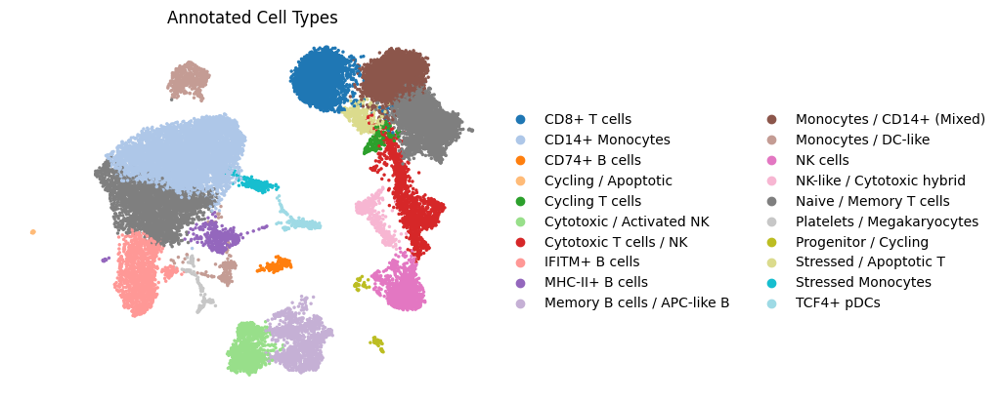

In [12]:
# Step 7: Assign names to clusters manually
cluster_annotations = {
    '0': 'CD14+ Monocytes',
    '1': 'Monocytes / CD14+ (Mixed)',
    '2': 'CD8+ T cells',
    '3': 'Naive / Memory T cells',
    '4': 'Naive / Memory T cells',
    '5': 'Cytotoxic T cells / NK',
    '6': 'Memory B cells / APC-like B',
    '7': 'IFITM+ B cells',
    '8': 'NK cells',
    '9': 'Cytotoxic / Activated NK',
    '10': 'Monocytes / DC-like',
    '11': 'NK-like / Cytotoxic hybrid',
    '12': 'MHC-II+ B cells',
    '13': 'Stressed / Apoptotic T',
    '14': 'TCF4+ pDCs',
    '15': 'Cycling T cells',
    '16': 'Stressed Monocytes',
    '17': 'CD74+ B cells',
    '18': 'Platelets / Megakaryocytes',
    '19': 'Progenitor / Cycling',
    '20': 'Cycling / Apoptotic'
}

adata.obs['cell_type'] = adata.obs['leiden'].map(cluster_annotations)
sc.pl.umap(
    adata,
    color='cell_type',
    legend_loc='right margin',         
    legend_fontsize=10,
    title='Annotated Cell Types',
    frameon=False,                     
    edges=False,                      
    size=25,                          
    palette='tab20'                    
)

# 🔍 Note:
# Although the Leiden algorithm is an unsupervised clustering method, it assigns a cluster label to each cell.
# These cluster assignments can then be treated as class labels for a supervised learning task.
# Here, we use XGBoost — a supervised model — to predict these cluster identities based solely on gene expression.
# This approach allows us to identify which genes are most important for distinguishing between the discovered cell populations.

#### Train/Test split and classification

In [13]:
X = adata.X
le = LabelEncoder()
y = le.fit_transform(adata.obs['cell_type'])
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2)


In [14]:
# Training the model
model = XGBClassifier(
    objective='multi:softprob',
    eval_metric='mlogloss',
    use_label_encoder=False
)
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...)

------------

##### Hyperparameters defaults work fine in many cases (and are optimized for general use), but they may not be optimal for your specific data — especially in a sensitive biological project like PBMC clustering.  use GridSearchCV to optimize performance. You'll get higher accuracy and better generalization, especially across rare cell types.

------------

#### Evaluating the model results

In [15]:
y_pred = model.predict(X_test)

# Classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.96      0.95       983
           1       0.97      0.97      0.97        31
           2       0.96      0.98      0.97       528
           3       1.00      0.75      0.86         4
           4       0.87      0.92      0.89        36
           5       0.96      0.96      0.96       189
           6       0.97      0.96      0.96       279
           7       0.95      0.95      0.95       235
           8       0.97      0.88      0.92        69
           9       0.96      0.97      0.97       253
          10       0.94      0.91      0.93       546
          11       0.98      0.96      0.97       133
          12       0.97      0.98      0.98       190
          13       0.94      0.95      0.94        78
          14       0.90      0.92      0.91      1024
          15       1.00      0.96      0.98        23
          16       1.00      0.67      0.80        15
          17       0.81    

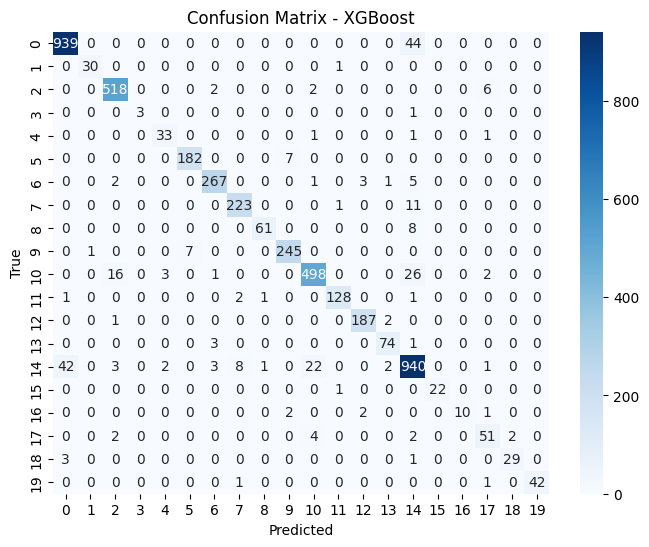

In [16]:
# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - XGBoost")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

In [17]:
# To see why we have lesser clusters in training data than its suppoused to 
print("All classes:", le.classes_)
print("Classes in test set:", set(y_test))
print("Decoded test labels:", set(le.inverse_transform(y_test)))

All classes: ['CD14+ Monocytes' 'CD74+ B cells' 'CD8+ T cells' 'Cycling / Apoptotic'
 'Cycling T cells' 'Cytotoxic / Activated NK' 'Cytotoxic T cells / NK'
 'IFITM+ B cells' 'MHC-II+ B cells' 'Memory B cells / APC-like B'
 'Monocytes / CD14+ (Mixed)' 'Monocytes / DC-like' 'NK cells'
 'NK-like / Cytotoxic hybrid' 'Naive / Memory T cells'
 'Platelets / Megakaryocytes' 'Progenitor / Cycling'
 'Stressed / Apoptotic T' 'Stressed Monocytes' 'TCF4+ pDCs']
Classes in test set: {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19}
Decoded test labels: {'Cycling / Apoptotic', 'IFITM+ B cells', 'CD14+ Monocytes', 'MHC-II+ B cells', 'Memory B cells / APC-like B', 'Monocytes / CD14+ (Mixed)', 'Platelets / Megakaryocytes', 'CD74+ B cells', 'Stressed / Apoptotic T', 'Cytotoxic / Activated NK', 'Cycling T cells', 'Progenitor / Cycling', 'NK cells', 'Monocytes / DC-like', 'NK-like / Cytotoxic hybrid', 'CD8+ T cells', 'Cytotoxic T cells / NK', 'Naive / Memory T cells', 'TCF4+ pDCs', 'St

In [18]:
print(pd.Series(adata.obs['cell_type']).value_counts())

cell_type
Naive / Memory T cells         5117
CD14+ Monocytes                4915
Monocytes / CD14+ (Mixed)      2730
CD8+ T cells                   2638
Cytotoxic T cells / NK         1396
Memory B cells / APC-like B    1263
IFITM+ B cells                 1174
NK cells                        952
Cytotoxic / Activated NK        943
Monocytes / DC-like             667
NK-like / Cytotoxic hybrid      390
MHC-II+ B cells                 344
Stressed / Apoptotic T          306
TCF4+ pDCs                      222
Cycling T cells                 179
Stressed Monocytes              166
CD74+ B cells                   155
Platelets / Megakaryocytes      117
Progenitor / Cycling             73
Cycling / Apoptotic              19
Name: count, dtype: int64


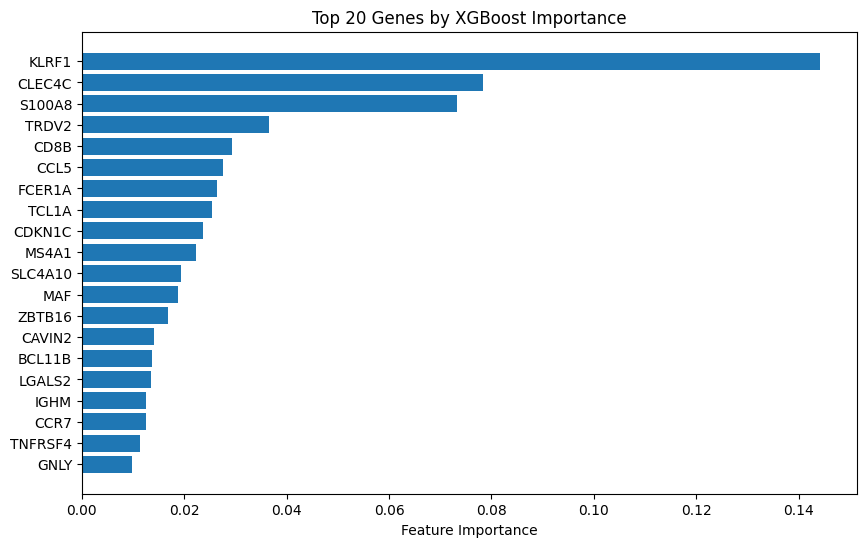

In [19]:
import matplotlib.pyplot as plt

importances = model.feature_importances_
top_indices = importances.argsort()[::-1][:20]
top_genes = adata.var_names[top_indices]

plt.figure(figsize=(10, 6))
plt.barh(range(len(top_genes)), importances[top_indices])
plt.yticks(range(len(top_genes)), top_genes)
plt.gca().invert_yaxis()
plt.title("Top 20 Genes by XGBoost Importance")
plt.xlabel("Feature Importance")
plt.show()
# how much they are expresed, high or less, uppregelated or downregulated it doesnt show, only gies what genes are present

-------------

## Using the shap SHAP (SHapley Additive exPlanations) into your scRNA-seq + XGBoost pipeline to interpret which genes are driving your model’s predictions.

In [20]:
# Use a small subset of genes for SHAP due to memory constraints
X_array = X_train if isinstance(X_train, np.ndarray) else X_train.toarray()

# Create the SHAP TreeExplainer
explainer = shap.TreeExplainer(model)

# Compute SHAP values (can take time)
shap_values = explainer.shap_values(X_array)

#### Global Feature Importance (Top Genes, how much each gene pushes predictions up or down)

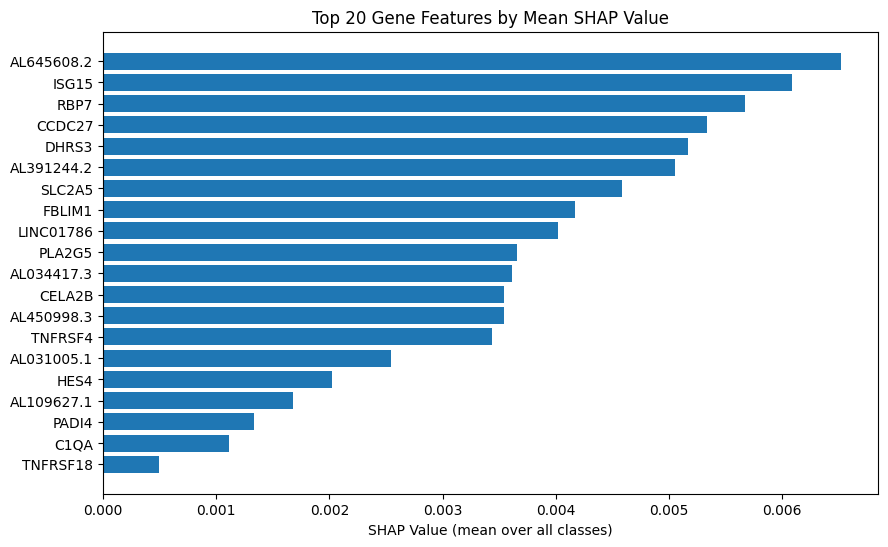

In [24]:
# Aggregate SHAP values across all classes (mean absolute values)
shap_mean = np.mean([np.abs(sv) for sv in shap_values], axis=0)
shap_sum = np.mean(shap_mean, axis=0)

# Get top genes
top_indices = shap_sum.argsort()[::-1][:20]
top_genes = adata.var_names[top_indices]

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.barh(range(len(top_genes)), shap_sum[top_indices])
plt.yticks(range(len(top_genes)), top_genes)
plt.gca().invert_yaxis()
plt.title("Top 20 Gene Features by Mean SHAP Value")
plt.xlabel("SHAP Value (mean over all classes)")
plt.show()

### SHAP Summary Plot, This shows how values of each gene affect predictions for all classes.

In [21]:
# Ensure gene names are set
gene_names = adata.var_names.tolist()

# Optional: confirm dimensions match
print(X_array.shape)                   # (n_samples, n_genes)
print(np.array(shap_values).shape)    # (n_classes, n_samples, n_genes)
print(len(gene_names))                # Should match n_genes

(19012, 2000)
(19012, 2000, 20)
2000


### to see it through in different clusters, first lets look into the dimension of gene matrix 

In [22]:
print(f"X_array.shape = {X_array.shape}")
print(f"shap_values.shape = {np.array(shap_values).shape}")


X_array.shape = (19012, 2000)
shap_values.shape = (19012, 2000, 20)


In [23]:
shap_values = shap_values.transpose(2, 0, 1)  # (n_classes, n_samples, n_features)

In [24]:
# Cluster index (change this to 1, 2, ... 21 to see other clusters)
cluster_id = 0 # we have 21 clusters 

# Check shape (safety)
print("shap_values[{}].shape = {}".format(cluster_id, shap_values[cluster_id].shape))
print("X_array.shape = ", X_array.shape)

shap_values[0].shape = (19012, 2000)
X_array.shape =  (19012, 2000)


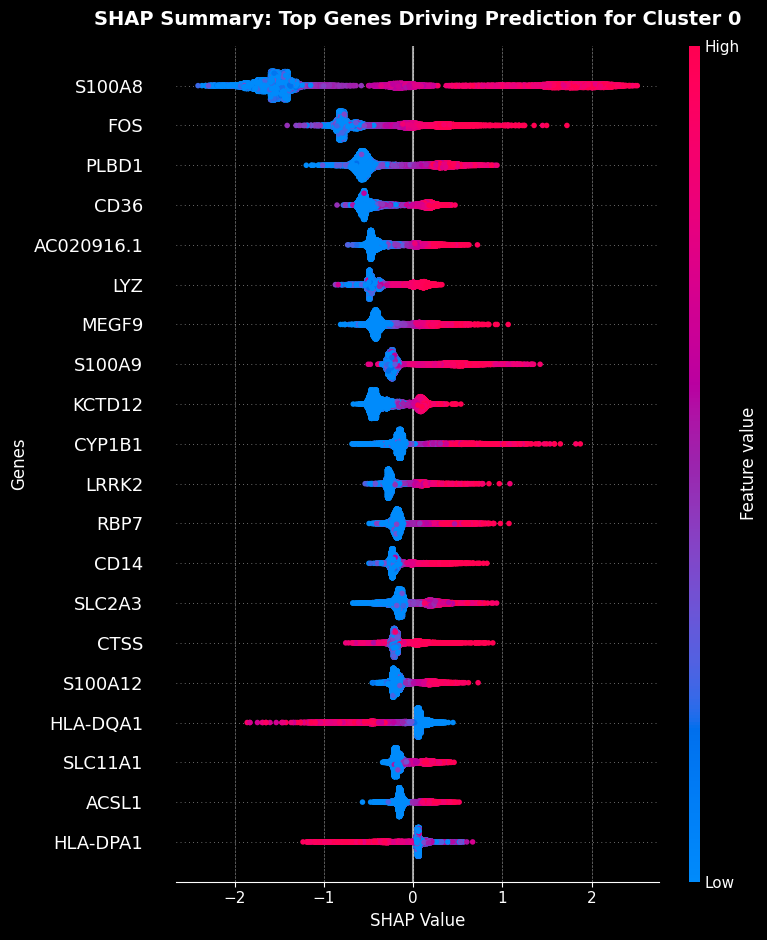

In [25]:
# 1️⃣ SHAP summary plot (but don't display yet)
shap.summary_plot(
    shap_values[cluster_id],
    X_array,
    feature_names=gene_names,
    show=False,
    plot_type="dot",
    color=plt.cm.coolwarm
)

# 2️⃣ Get current figure and axes
fig = plt.gcf()
ax = plt.gca()

# 3️⃣ Set black background
fig.patch.set_facecolor('black')  # Whole canvas
ax.set_facecolor('black')         # Plot area

# 4️⃣ Set axis text/ticks to white
ax.tick_params(colors='white')
ax.xaxis.label.set_color('white')
ax.yaxis.label.set_color('white')
ax.title.set_color('white')

# 5️⃣ Format spines
for spine in ['bottom', 'left']:
    ax.spines[spine].set_color('white')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# 6️⃣ Format colorbar (if it exists)
if len(fig.axes) > 1 and fig.axes[-1] is not ax:
    cbar_ax = fig.axes[-1]
    cbar_ax.tick_params(colors='white')

    # Set colorbar spines to white
    for spine in cbar_ax.spines.values():
        spine.set_edgecolor('white')

    # Set label color if label text exists
    if cbar_ax.yaxis.label.get_text():
        cbar_ax.yaxis.label.set_color('white')

# 7️⃣ Add grid
ax.grid(True, axis='x', linestyle='--', linewidth=0.5, alpha=0.5, color='white')

# 8️⃣ Add custom title and axis labels
ax.set_title(
    f"SHAP Summary: Top Genes Driving Prediction for Cluster {cluster_id}",
    fontsize=14, fontweight='bold', pad=15, color='white'
)
ax.set_xlabel("SHAP Value", fontsize=12, color='white')
ax.set_ylabel("Genes", fontsize=12, color='white')

plt.tight_layout()
plt.show()

--------

## Compare top 20 HVGs vs top 20 SHAP genes


### Extract HVGs from AnnData (adata)

In [26]:
mean_abs_shap = np.abs(shap_values).mean(axis=(0, 1))

# Now the lengths should match
print("mean_abs_shap.shape:", mean_abs_shap.shape)  
print("len(gene_names):", len(gene_names))          

# Create SHAP importance DataFrame
shap_importance_df = pd.DataFrame({
    'gene': gene_names,
    'importance': mean_abs_shap
}).sort_values(by='importance', ascending=False)

mean_abs_shap.shape: (2000,)
len(gene_names): 2000


In [27]:
gene_names = adata.var_names.tolist()  # use only genes in the current filtered AnnData

# Then continue:
shap_importance_df = pd.DataFrame({
    'gene': gene_names,
    'importance': mean_abs_shap
})

In [28]:
print("len(gene_names):", len(gene_names))
print("mean_abs_shap.shape:", mean_abs_shap.shape)


len(gene_names): 2000
mean_abs_shap.shape: (2000,)


In [29]:
mean_abs_shap = np.abs(shap_values).mean(axis=(0, 1)) # mean over samples and classes → shape: (n_genes,)

# Step 2: Map each gene name to its mean SHAP importance
shap_importance_df = pd.DataFrame({
    'gene': gene_names,
    'importance': mean_abs_shap
}).sort_values(by='importance', ascending=False)

# Step 3: Sort by importance
shap_importance_df = shap_importance_df.sort_values(by='importance', ascending=False)

# Step 4: Extract top SHAP genes
top_shap_genes = shap_importance_df['gene'].head(20).tolist()

print("Top 20 SHAP genes:\n", top_shap_genes)

Top 20 SHAP genes:
 ['MS4A1', 'NKG7', 'MT-CO3', 'S100A4', 'CCL5', 'GNLY', 'CTSS', 'LYZ', 'RPS5', 'CD79A', 'FCGR3A', 'IL32', 'IGHM', 'CD8B', 'CD74', 'RTKN2', 'S100A8', 'S100A6', 'KLRK1', 'NEAT1']


In [30]:
# Normalize Gene Names (remove suffixes like .1, unify case)
def clean_gene_name(gene):
    return gene.split('.')[0].upper()  # remove version suffix, convert to uppercase

In [31]:
top_hvgs = list(adata.var[adata.var['highly_variable']].index[:20])
print("Top 20 HGVs genes:\n", top_hvgs)

Top 20 HGVs genes:
 ['AL645608.2', 'HES4', 'ISG15', 'TNFRSF18', 'TNFRSF4', 'LINC01786', 'AL391244.2', 'CCDC27', 'AL034417.3', 'SLC2A5', 'RBP7', 'DHRS3', 'CELA2B', 'AL450998.3', 'FBLIM1', 'AL109627.1', 'PADI4', 'PLA2G5', 'AL031005.1', 'C1QA']


In [32]:
# Assuming these lists already exist
## Top 20 SHAP genes (already sorted)
top_shap_genes = list(shap_importance_df['gene'].head(20))

# Top 20 HVGs (from scanpy)
top_hvgs = list(adata.var[adata.var['highly_variable']].index[:20])

# Compare
shared = set(top_shap_genes) & set(top_hvgs)
only_shap = set(top_shap_genes) - set(top_hvgs)
only_hvg = set(top_hvgs) - set(top_shap_genes)

print("🔁 Shared genes:", shared)
print("🔹 Only SHAP:", only_shap)
print("🔸 Only HVG:", only_hvg)

🔁 Shared genes: set()
🔹 Only SHAP: {'S100A6', 'CD79A', 'S100A8', 'KLRK1', 'MS4A1', 'IGHM', 'RPS5', 'FCGR3A', 'LYZ', 'CTSS', 'MT-CO3', 'CCL5', 'CD74', 'RTKN2', 'CD8B', 'IL32', 'NKG7', 'S100A4', 'GNLY', 'NEAT1'}
🔸 Only HVG: {'AL391244.2', 'RBP7', 'DHRS3', 'CELA2B', 'SLC2A5', 'CCDC27', 'PADI4', 'HES4', 'AL645608.2', 'LINC01786', 'C1QA', 'TNFRSF4', 'AL450998.3', 'AL034417.3', 'TNFRSF18', 'AL031005.1', 'FBLIM1', 'ISG15', 'AL109627.1', 'PLA2G5'}


In [33]:
# Clean the gene names
cleaned_shap = set([clean_gene_name(g) for g in top_shap_genes])
cleaned_hvg = set([clean_gene_name(g) for g in top_hvgs])

# Compare overlap
shared_genes = cleaned_shap & cleaned_hvg
only_shap = cleaned_shap - cleaned_hvg
only_hvg = cleaned_hvg - cleaned_shap

# Print the results
print(f"Top 20 SHAP genes:\n{cleaned_shap}")
print(f"Top 20 HVGs:\n{cleaned_hvg}")
print(f"🔁 Shared genes ({len(shared_genes)}):\n{shared_genes}")
print(f"❗ SHAP-only genes ({len(only_shap)}):\n{only_shap}")
print(f"📉 HVG-only genes ({len(only_hvg)}):\n{only_hvg}")

Top 20 SHAP genes:
{'S100A6', 'CD79A', 'S100A8', 'KLRK1', 'MS4A1', 'IGHM', 'RPS5', 'FCGR3A', 'LYZ', 'CTSS', 'MT-CO3', 'CCL5', 'CD74', 'RTKN2', 'CD8B', 'IL32', 'NKG7', 'S100A4', 'GNLY', 'NEAT1'}
Top 20 HVGs:
{'AL645608', 'RBP7', 'DHRS3', 'AL109627', 'CELA2B', 'SLC2A5', 'AL391244', 'CCDC27', 'PADI4', 'HES4', 'LINC01786', 'C1QA', 'TNFRSF4', 'TNFRSF18', 'AL031005', 'FBLIM1', 'ISG15', 'AL034417', 'AL450998', 'PLA2G5'}
🔁 Shared genes (0):
set()
❗ SHAP-only genes (20):
{'S100A6', 'CD79A', 'S100A8', 'KLRK1', 'MS4A1', 'IGHM', 'RPS5', 'FCGR3A', 'LYZ', 'CTSS', 'MT-CO3', 'CCL5', 'CD74', 'RTKN2', 'CD8B', 'IL32', 'NKG7', 'S100A4', 'GNLY', 'NEAT1'}
📉 HVG-only genes (20):
{'AL645608', 'CELA2B', 'RBP7', 'AL109627', 'DHRS3', 'SLC2A5', 'AL391244', 'CCDC27', 'PADI4', 'HES4', 'LINC01786', 'C1QA', 'TNFRSF4', 'TNFRSF18', 'AL031005', 'FBLIM1', 'ISG15', 'AL034417', 'AL450998', 'PLA2G5'}


HVGs are selected based on dispersion (variance), not on their relevance to any label or outcome. They can be housekeeping genes, noisy, or non-informative in prediction.

SHAP genes are selected from the trained model, showing which genes the model uses most for classification. These are often known markers.

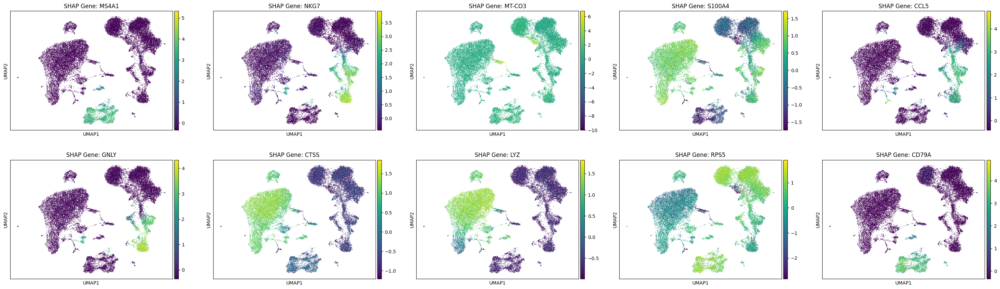

In [ ]:
# Pick top SHAP genes — can adjust to 5 or 10 if 20 is too many to view
genes_to_plot = top_shap_genes[:10]  # or [:5] for faster viewing

# Plot each gene expression on UMAP
sc.pl.umap(
    adata,
    color=genes_to_plot,
    cmap="viridis",  # or "plasma", "Reds", etc.
    gene_symbols=None,
    ncols=5,  # Arrange plots in a grid
    title=[f"SHAP Gene: {g}" for g in genes_to_plot],
    use_raw=False  # Set True if adata.raw exists and is needed
)


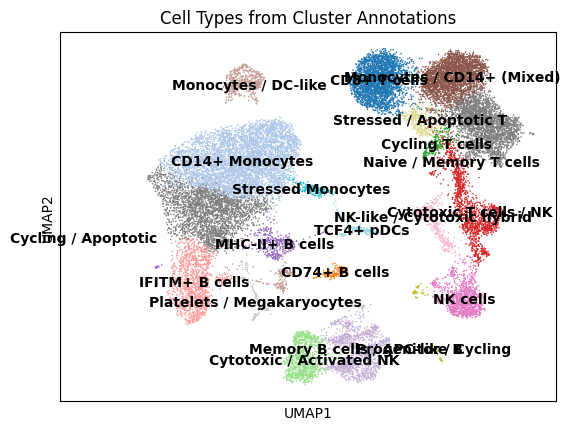

In [ ]:
sc.pl.umap(adata, color='cell_type', legend_loc='on data', title='Cell Types from Cluster Annotations')

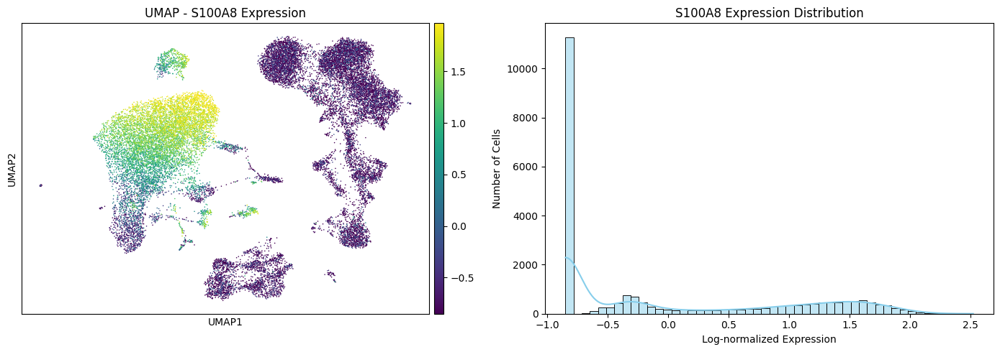

In [35]:
# Replace with your actual gene name
example_gene = "S100A8"

# Create side-by-side figure
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: UMAP with expression of the selected gene
sc.pl.umap(
    adata,
    color=example_gene,
    ax=axes[0],
    show=False,
    title=f"UMAP - {example_gene} Expression",
    color_map='viridis',
    vmax='p99',  # ignore outlier extreme values
    legend_loc='right margin'
)

# Plot 2: Histogram of expression values
gene_expr = adata[:, example_gene].X.toarray().flatten()
sns.histplot(gene_expr, bins=50, ax=axes[1], kde=True, color='skyblue')
axes[1].set_title(f"{example_gene} Expression Distribution")
axes[1].set_xlabel("Log-normalized Expression")
axes[1].set_ylabel("Number of Cells")

plt.tight_layout()
plt.show()

###  Train Model Using SHAP-only Genes

In [36]:
# -- Prepare SHAP-only gene subset ----------------------------------------
shap_only_genes_in_data = [gene for gene in only_shap if gene in adata.var_names]

# Create subset AnnData
adata_shap = adata[:, shap_only_genes_in_data].copy()
X_shap = adata_shap.X

# -- Encode labels --------------------------------------------------------
le = LabelEncoder()
y = le.fit_transform(adata.obs['cell_type'])  # adjust 'cell_type' if you use a different label

# -- Split data -----------------------------------------------------------
X_train, X_test, y_train, y_test = train_test_split(X_shap, y, stratify=y, test_size=0.2, random_state=42)

# -- Train XGBoost model --------------------------------------------------
model = XGBClassifier(objective='multi:softprob', eval_metric='mlogloss', use_label_encoder=False)
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...)

In [37]:
# -- Evaluate classification ----------------------------------------------
y_pred = model.predict(X_test)
print("\n📋 Classification Report (SHAP-only genes):")
print(classification_report(y_test, y_pred, target_names=le.classes_))


📋 Classification Report (SHAP-only genes):
                             precision    recall  f1-score   support

            CD14+ Monocytes       0.89      0.91      0.90       983
              CD74+ B cells       0.93      0.90      0.92        31
               CD8+ T cells       0.94      0.95      0.95       528
        Cycling / Apoptotic       0.00      0.00      0.00         4
            Cycling T cells       0.73      0.53      0.61        36
   Cytotoxic / Activated NK       0.82      0.79      0.80       189
     Cytotoxic T cells / NK       0.85      0.85      0.85       279
             IFITM+ B cells       0.90      0.91      0.90       235
            MHC-II+ B cells       0.90      0.90      0.90        69
Memory B cells / APC-like B       0.83      0.86      0.84       253
  Monocytes / CD14+ (Mixed)       0.82      0.86      0.84       546
        Monocytes / DC-like       0.92      0.92      0.92       133
                   NK cells       0.92      0.93      0.92

In [38]:
# -- AUC/performance-based ranking ----------------------------------------

# Create DataFrame from gene expression
X_df = pd.DataFrame(adata_shap.X, columns=shap_only_genes_in_data)

# Binarize multiclass labels for AUC (One-vs-Rest)
y_bin = label_binarize(y, classes=np.unique(y))

# Split again for gene-level AUC
X_train_df, X_test_df, y_train_bin, y_test_bin = train_test_split(X_df, y_bin, stratify=y, test_size=0.2, random_state=42)

# Compute AUC per gene
auc_results = []
for gene in shap_only_genes_in_data:
    gene_test = X_test_df[[gene]]
    try:
        auc = roc_auc_score(y_test_bin, gene_test, average='macro', multi_class='ovr')
        auc_results.append((gene, auc))
    except ValueError:
        auc_results.append((gene, np.nan))  # fallback for edge cases

# Create and sort AUC DataFrame
auc_df = pd.DataFrame(auc_results, columns=['Gene', 'AUC']).sort_values(by='AUC', ascending=False)
print("\n📈 Top SHAP genes by individual AUC performance:")
print(auc_df.head(10))


📈 Top SHAP genes by individual AUC performance:
      Gene       AUC
2   S100A8  0.982033
8      LYZ  0.960025
9     CTSS  0.920957
0   S100A6  0.917437
19   NEAT1  0.871024
17  S100A4  0.836956
12    CD74  0.646505
10  MT-CO3  0.510725
13   RTKN2  0.483520
7   FCGR3A  0.454579


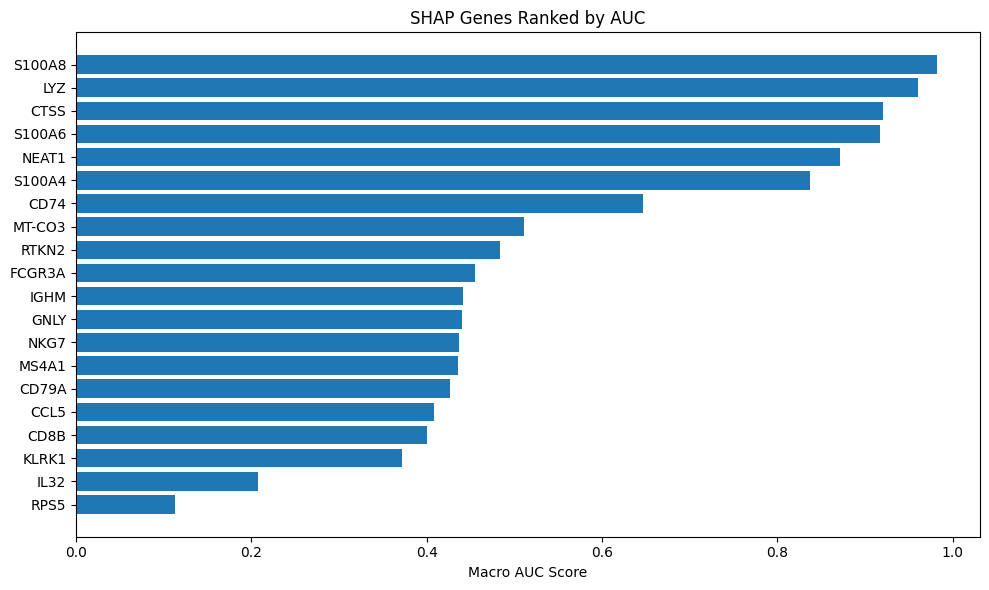

In [39]:
# Optional: Bar plot
plt.figure(figsize=(10,6))
plt.barh(auc_df['Gene'], auc_df['AUC'])
plt.xlabel("Macro AUC Score")
plt.title("SHAP Genes Ranked by AUC")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [40]:
# -- Check HVGs not in SHAP -----------------------------------------------
unused_hvgs = only_hvg - only_shap
unused_hvgs_in_data = [gene for gene in unused_hvgs if gene in adata.var_names]
print("\n🧪 HVGs not used in SHAP (first 20):", unused_hvgs_in_data[:20])


🧪 HVGs not used in SHAP (first 20): ['RBP7', 'CELA2B', 'DHRS3', 'SLC2A5', 'CCDC27', 'PADI4', 'HES4', 'LINC01786', 'C1QA', 'TNFRSF4', 'TNFRSF18', 'FBLIM1', 'ISG15', 'PLA2G5']


------

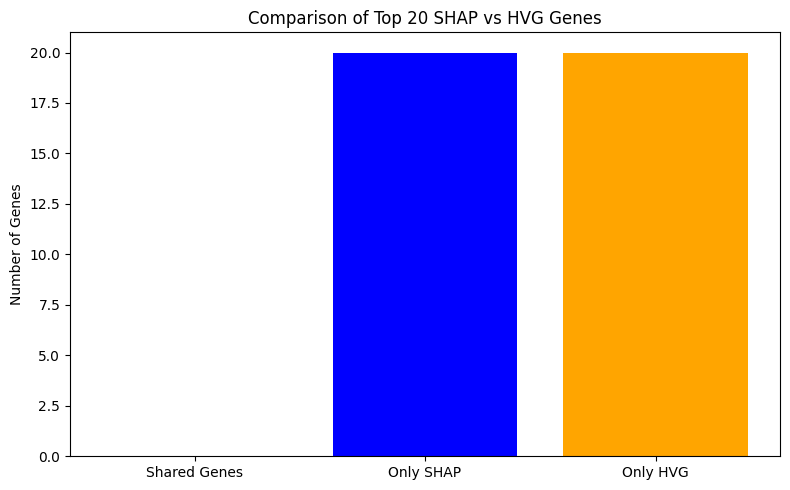

Shared Top Genes: []


In [43]:
# Step 1: Compute mean absolute SHAP value per gene
mean_abs_shap = np.abs(shap_values).mean(axis=(0, 1))  # shape: (n_genes,)
shap_df = pd.DataFrame({'gene': gene_names, 'mean_abs_shap': mean_abs_shap})
top_shap_genes = shap_df.sort_values(by='mean_abs_shap', ascending=False).head(20)['gene'].tolist()

# Step 2: Now top_hvgs is defined
shap_set = set(top_shap_genes)
hvg_set = set(top_hvgs)

shared_genes = shap_set & hvg_set
only_shap = shap_set - hvg_set
only_hvg = hvg_set - shap_set

# Step 4: Visualize
labels = ['Shared Genes', 'Only SHAP', 'Only HVG']
counts = [len(shared_genes), len(only_shap), len(only_hvg)]

plt.figure(figsize=(8, 5))
plt.bar(labels, counts, color=['green', 'blue', 'orange'])
plt.title("Comparison of Top 20 SHAP vs HVG Genes")
plt.ylabel("Number of Genes")
plt.tight_layout()
plt.show()

# Step 5: Output refined marker gene candidates
print("Shared Top Genes:", list(shared_genes))

When comparing the top 20 genes identified by:

SHAP (model-driven gene importance via XGBoost)

HVG (variance-based gene selection)

Interpretation:
HVGs select genes with high variability regardless of outcome or label. It is an unsupervised metric focused on dispersion.

SHAP values, on the other hand, reflect genes that are predictive of cluster identity, capturing model-based relevance.

❗ The fact that no genes overlap between SHAP and HVGs suggests that:

Genes with highest variability are not necessarily the most discriminative.

Some HVGs might add noise or be irrelevant to classification.

### Create a folder to store all UMAP plots


In [ ]:
output_dir = "shap_umap_clusterwise"
os.makedirs(output_dir, exist_ok=True)

# Number of top genes to show per cluster
top_n = 5

# Compute mean SHAP value per gene, per class
# shap_values: shape (n_classes, n_samples, n_genes)
n_classes = shap_values.shape[0]

for i in range(n_classes):
    print(f"Generating plots for cluster {i}...")

    # Step 1: Get top SHAP genes for cluster i
    class_shap = shap_values[i]  # shape (n_samples, n_genes)
    mean_shap = np.abs(class_shap).mean(axis=0)  # shape (n_genes,)
    top_gene_indices = np.argsort(mean_shap)[::-1][:top_n]
    top_genes = [gene_names[j] for j in top_gene_indices]

    # Step 2: Plot each gene on UMAP
    sc.pl.umap(
        adata,
        color=top_genes,
        title=[f"Cluster {i} - SHAP Gene: {g}" for g in top_genes],
        cmap="viridis",
        ncols=5,
        use_raw=False,
        show=False,
        save=f"/{output_dir}/cluster_{i}_shap_genes.png"
    )

----------------